In [ ]:
################################################################################
#
#                           --- HEADER COMMENT BLOCK ---
#
################################################################################
#
# Program Title:
#   Tilapia Freshness Detection using Fine-Tuned RT-DETR V2
#
# ------------------------------------------------------------------------------
#
# Programmers:
#   [Enter Your Name or Team Name Here]
#
# ------------------------------------------------------------------------------
#
# Where the program fits in the general system designs:
#   This script is a complete workflow for training and evaluating a custom
#   object detection model within a Google Colab environment. The trained
#   model is the core component of a larger system designed for automated
#   quality assessment in the fishing or food industry. The output of this
#   program (the trained model weights and configuration files) is intended
#   to be deployed in an application (e.g., a mobile app or an automated
#   conveyor belt scanner) for real-time inference.
#
# ------------------------------------------------------------------------------
#
# Date written and revised:
#   Date Written: [e.g., 2024-10-01]
#   Last Revised: [e.g., 2024-11-15]
#
# ------------------------------------------------------------------------------
#
# Purpose:
#   The primary purpose of this program is to train the RT-DETR V2
#   model on a custom dataset of tilapia images. The goal is to accurately
#   detect and classify the freshness of a tilapia by analyzing two key
#   features: the eye and the gill. The script automates the entire machine
#   learning pipeline, including data loading, preprocessing, augmentation,
#   model training, performance evaluation, and inference on test images.
#
# ------------------------------------------------------------------------------
#
# Data structures, algorithms, and control:
#
#   Data Structures:
#     - torch.Tensor: The fundamental data structure used for images, model
#       weights, and predictions.
#     - PyTorch Dataset: A custom class (`DetectionDataset`) is used to load
#       and serve images and their corresponding annotations (bounding boxes
#       and labels) batch by batch.
#     - Dictionaries: Used to store annotations in the COCO format ({'image_id',
#       'annotations', 'categories'}).
#     - supervision.Detections: A specialized data structure from the Roboflow
#       Supervision library used to handle and manipulate model predictions,
#       including bounding boxes, confidence scores, and class IDs.
#
#   Algorithms:
#     - RT-DETR V2 (Real-Time DEtection TRansformer): The core object detection
#       algorithm used. It is a state-of-the-art, end-to-end detector that
#       leverages transformers for high accuracy and real-time performance.
#     - Fine-Tuning: The training process does not start from scratch; instead, it
#       adapts a model pre-trained on the COCO dataset to our specific task of
#       detecting tilapia freshness.
#     - Mean Average Precision (mAP): The primary algorithm used for evaluating
#       the performance of the object detection model. A custom evaluator
#       (`MAPEvaluator`) is implemented to compute this metric.
#     - Non-Max Suppression (NMS): An algorithm applied during post-processing
#       to filter out redundant and overlapping bounding box predictions,
#       ensuring each object is detected only once.
#     - Image Augmentation: Techniques from the `albumentations` library (e.g.,
#       random flips, brightness adjustments) are applied to the training data
#       to increase its diversity and prevent model overfitting.
#
#   Control Flow:
#     1. Initial Setup: The script begins by mounting Google Drive, setting the
#        working directory, and installing all required Python dependencies.
#     2. Model Loading: The pre-trained RT-DETR V2 model and its associated
#        image processor are loaded from the Hugging Face Hub.
#     3. Data Preparation: The custom tilapia dataset is downloaded from
#        Roboflow. Images and annotations are loaded and split into training,
#        validation, and test sets.
#     4. Preprocessing & Augmentation: An augmentation pipeline is defined,
#        and the datasets are formatted to match the input requirements of
#        the RT-DETR model.
#     5. Training: Hyperparameters (e.g., learning rate, batch size, number of
#        epochs) are defined. The `transformers.Trainer` is configured with the
#        model, datasets, and a custom evaluation function. The `train()`
#        method is called to start the fine-tuning process.
#     6. Evaluation: During and after training, the model's performance is
#        evaluated on the validation set using the mAP metric. A final
#        confusion matrix is calculated on the test set.
#     7. Model Saving: The fine-tuned model and its configuration are saved to
#        Google Drive for future use.
#     8. Inference: The script demonstrates how to use the trained model to make
#        predictions on both a batch of test images and a single, unseen image,
#        visualizing the results alongside the ground truth.
#
################################################################################```

In [ ]:
# @title Check Collab GPU
!nvidia-smi

Fri Oct  3 10:33:57 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Initial Setup for Training

### Test for mounting google drive and working repository

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


### Install dependencies

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q git+https://github.com/roboflow/supervision.git
!pip install -q roboflow pycocotools
!pip install -q accelerate
!pip install -q roboflow
!pip install -q torchmetrics
!pip install -q "albumentations>=2.0.8"

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 528.7/528.7 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 102.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gradio 5.46.0 requires huggingface-hub<1.0,>=0.33.5, but you have huggingface-hub 1.0.0rc2 which is incompatible.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.8/89.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9

### Imports and Loading the Model

In [ ]:
import torch
import requests

import numpy as np
import supervision as sv
import albumentations as A

from PIL import Image
from pprint import pprint
from roboflow import Roboflow
from dataclasses import dataclass, replace
from google.colab import userdata
from torch.utils.data import Dataset
from transformers import (
    AutoImageProcessor,
    AutoModelForObjectDetection,
    TrainingArguments,
    Trainer,
    EarlyStoppingCallback,
    RTDetrForObjectDetection,
    RTDetrImageProcessor
)
from pycocotools.coco import COCO
from torchmetrics.detection.mean_ap import MeanAveragePrecision

In [ ]:
# @title Load model

CHECKPOINT = "PekingU/rtdetr_v2_r50vd"
#CHECKPOINT = "/content/drive/MyDrive/rt-detr-checkpoint"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = AutoModelForObjectDetection.from_pretrained(CHECKPOINT).to(DEVICE)
processor = AutoImageProcessor.from_pretrained(CHECKPOINT, use_fast=True)


#If Inference or testing mode na. Comment nalang ulit
#CHECKPOINT = "/content/drive/MyDrive/rt-detr-checkpoint"
#model = AutoModelForObjectDetection.from_pretrained("/content/drive/MyDrive/rt-detr-checkpoint")
#processor = AutoImageProcessor.from_pretrained("/content/drive/MyDrive/rt-detr-checkpoint")
#model.to(DEVICE)
#model.eval()


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/172M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/444 [00:00<?, ?B/s]

## Fine-tune RT-DETR on custom dataset

In [ ]:
# @title Download dataset from Roboflow Universe

rf = Roboflow(api_key="DgfLxMcP05vfRZ9iRjtJ")
project = rf.workspace("thesis-vbq8h").project("tilapia-gills-eyes-dataset-osayx")
version = project.version(6)
dataset = version.download("coco")


In [ ]:
# @title Removing extra label created upon creation by Roboflow
import json
from collections import defaultdict

# --- Configuration ---
CLASS_TO_REMOVE = 'fish_parts'

for split in ["train", "valid", "test"]:
    ann_path = f"{dataset.location}/{split}/_annotations.coco.json"

    print(f"Processing {split} split...")

    with open(ann_path, "r") as f:
        coco = json.load(f)

    category_to_remove_id = None
    for cat in coco["categories"]:
        if cat["name"] == CLASS_TO_REMOVE:
            category_to_remove_id = cat["id"]
            break

    if category_to_remove_id is not None:
        print(f"  Found '{CLASS_TO_REMOVE}' with ID: {category_to_remove_id}")

        # Filter out the unwanted category from the categories list
        coco["categories"] = [cat for cat in coco["categories"] if cat["name"] != CLASS_TO_REMOVE]

        # Filter out annotations associated with the removed category
        original_ann_count = len(coco["annotations"])
        coco["annotations"] = [ann for ann in coco["annotations"] if ann["category_id"] != category_to_remove_id]
        print(f"  Removed {original_ann_count - len(coco['annotations'])} annotations belonging to '{CLASS_TO_REMOVE}'.")

    else:
        print(f"  '{CLASS_TO_REMOVE}' not found in categories. Skipping removal for this split.")


    # Re-index the remaining categories to be sequential (starting from 0)
    old_id_to_new_id = {}
    new_categories = []
    for new_id, category in enumerate(coco["categories"]):
        old_id = category["id"]
        old_id_to_new_id[old_id] = new_id
        category["id"] = new_id
        new_categories.append(category)

    coco["categories"] = new_categories

    # Update all remaining annotations to use the new category IDs
    for ann in coco["annotations"]:
        old_cat_id = ann["category_id"]
        if old_cat_id in old_id_to_new_id:
            ann["category_id"] = old_id_to_new_id[old_cat_id]

    # Save the updated annotations back to the file
    with open(ann_path, "w") as f:
        json.dump(coco, f, indent=2)

    print(f"Cleaned and re-indexed {split} annotations.")

# Build the final id2label and label2id mappings from the cleaned train set
print("\n--- Verification ---")
with open(f"{dataset.location}/train/_annotations.coco.json", "r") as f:
    coco = json.load(f)

id2label = {cat["id"]: cat["name"] for cat in coco["categories"]}
label2id = {name: idx for idx, name in id2label.items()}

print(f"Number of classes after cleanup: {len(coco['categories'])}")
print(f"Final id2label: {id2label}")
print(f"Final label2id: {label2id}")

# Verify that the unwanted class is no longer present
unique_names = set(id2label.values())
if CLASS_TO_REMOVE in unique_names:
    print(f"Verification Failed: '{CLASS_TO_REMOVE}' is still present.")
else:
    print(f"Verification Successful: '{CLASS_TO_REMOVE}' has been removed.")

In [ ]:
# @title Load training set
ds_train = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/train",
    annotations_path=f"{dataset.location}/train/_annotations.coco.json",
)

# Load test set
ds_test = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

# Validation test set
ds_val = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/valid",
    annotations_path=f"{dataset.location}/valid/_annotations.coco.json",
)

print(f"Number of training images: {len(ds_train)}")
print(f"Number of test images: {len(ds_test)}")
print(f"Number of test images: {len(ds_val)}")
print(label2id)

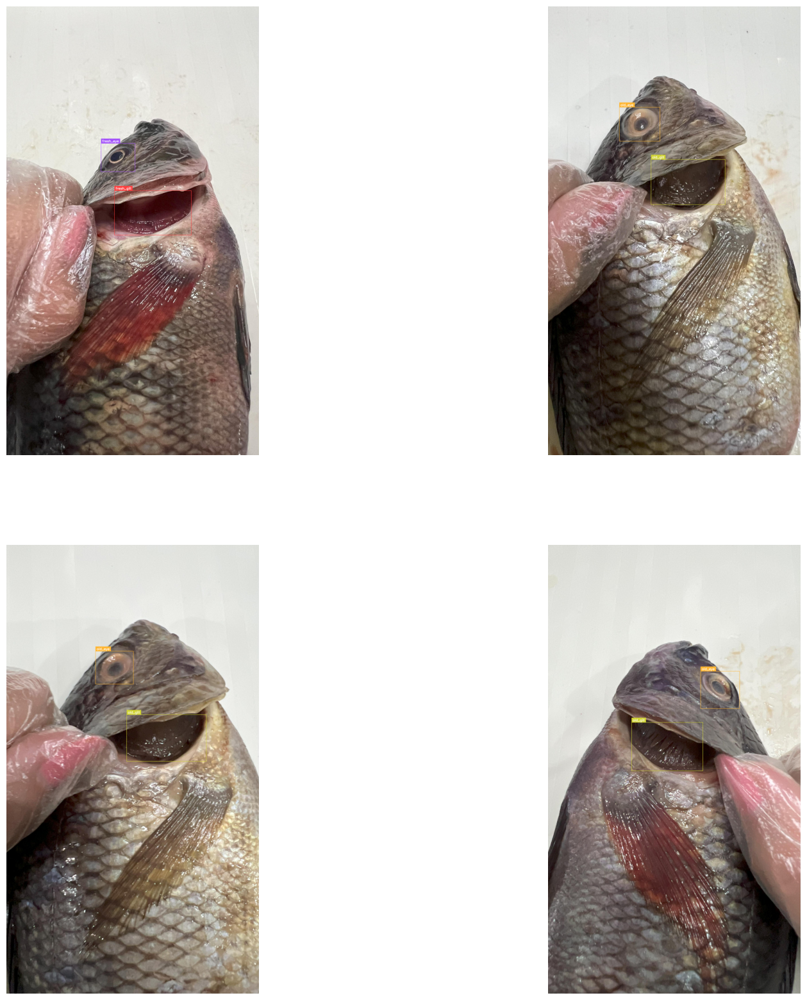

In [ ]:
# @title Display dataset sample

GRID_SIZE = 2

def annotate(image, annotations, classes):
    labels = [
        classes[class_id]
        for class_id in annotations.class_id
    ]

    bounding_box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator(text_scale=1, text_thickness=2)

    annotated_image = image.copy()
    annotated_image = bounding_box_annotator.annotate(annotated_image, annotations)
    annotated_image = label_annotator.annotate(annotated_image, annotations, labels=labels)
    return annotated_image

annotated_images = []
for i in range(GRID_SIZE * GRID_SIZE):
    _, image, annotations = ds_train[i]
    annotated_image = annotate(image, annotations, ds_train.classes)
    annotated_images.append(annotated_image)


sv.plot_images_grid(
    images=annotated_images,
    grid_size=(GRID_SIZE, GRID_SIZE),
    size=(20, 20)
)

### Preprocess the data



In [ ]:
IMAGE_SIZE = 640

processor = AutoImageProcessor.from_pretrained(
    CHECKPOINT,
    do_resize=True,
    size={"width": IMAGE_SIZE, "height": IMAGE_SIZE},
)

In [ ]:
# @title Image Augmentations
import albumentations as A

train_augmentation_and_transform = A.Compose(
    [
        # Rotates and Flips
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=5, border_mode=0, p=0.2),

        # Colors
        A.ColorJitter(
            brightness=0.2,
            contrast=0.2,
            saturation=0.25,
            hue=0.08,
            p=0.6
        ),

        # Random Augment for brightness and gamma
        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1.0),
            A.RandomGamma(gamma_limit=(85, 120), p=1.0),
        ], p=0.3),

        # Random Quality augments
        A.OneOf([
            A.GaussNoise(var_limit=(5.0, 20.0), p=1.0),
            A.Blur(blur_limit=3, p=1.0),
        ], p=0.15),
    ],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=25,
        min_visibility=0.3
    ),
)

valid_transform = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=1
    ),
)


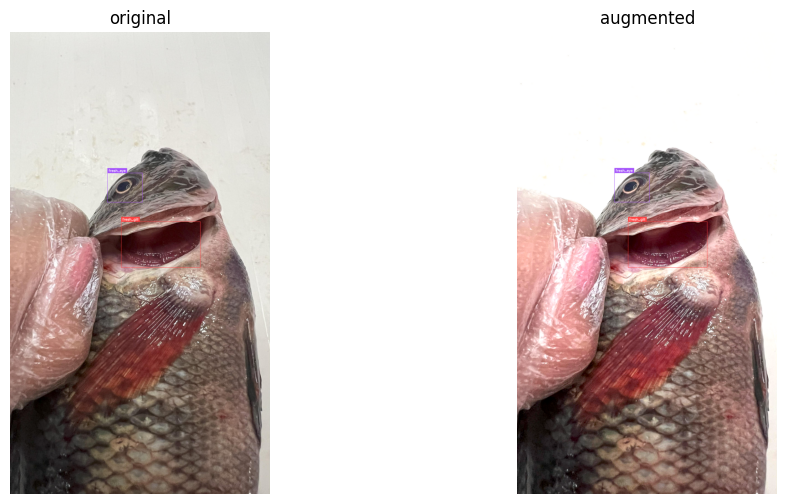

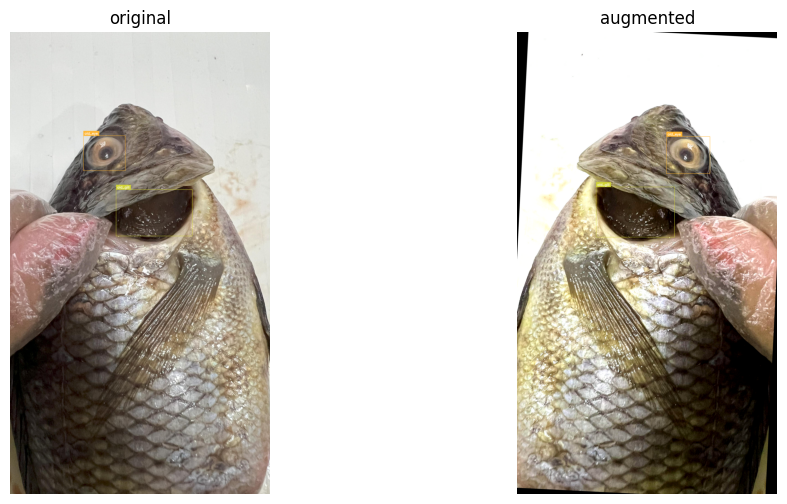

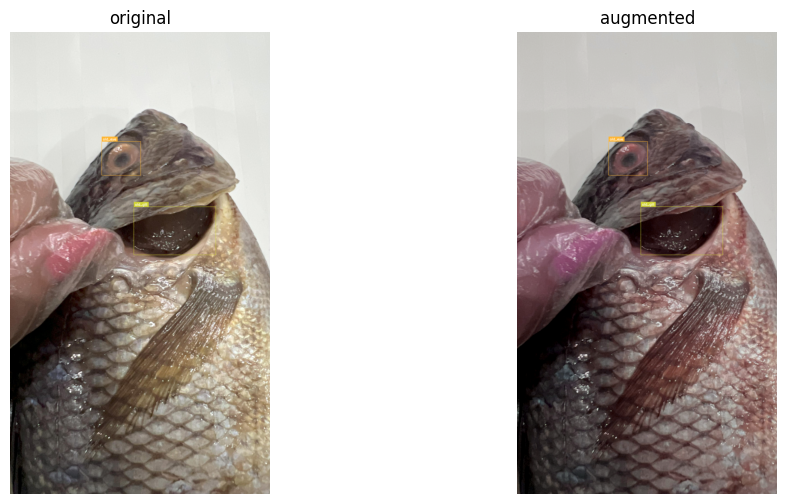

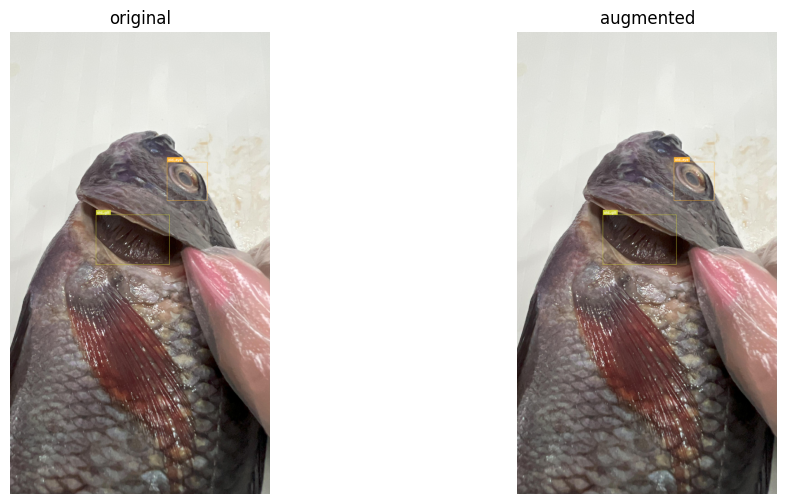

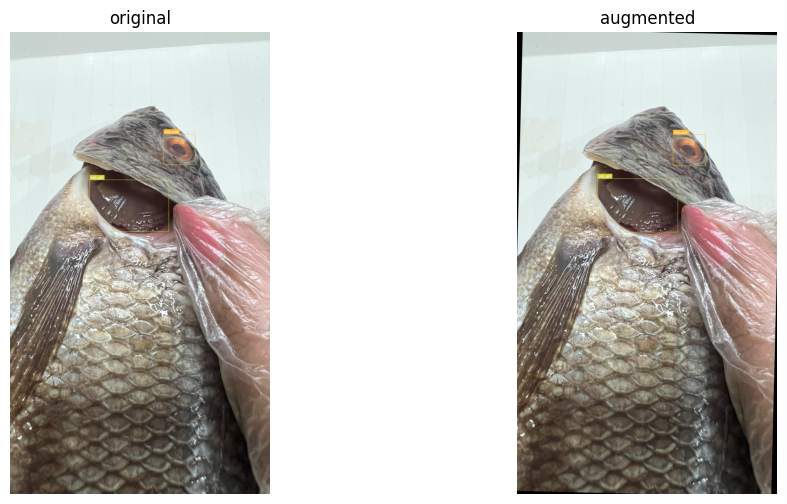

...

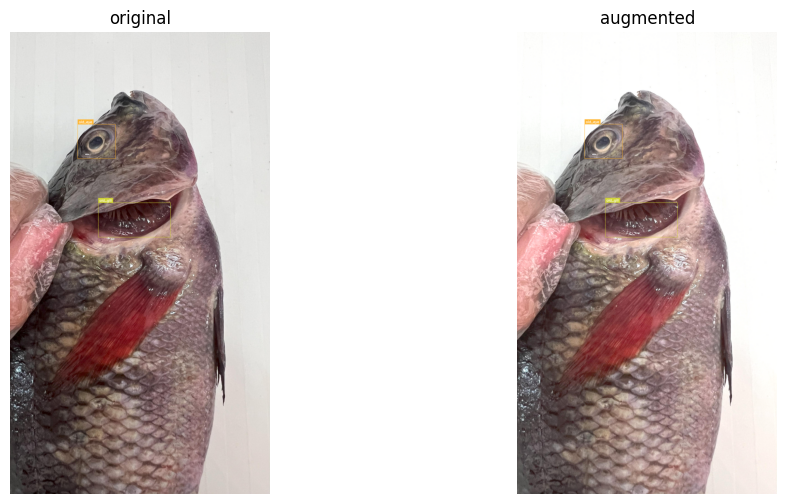

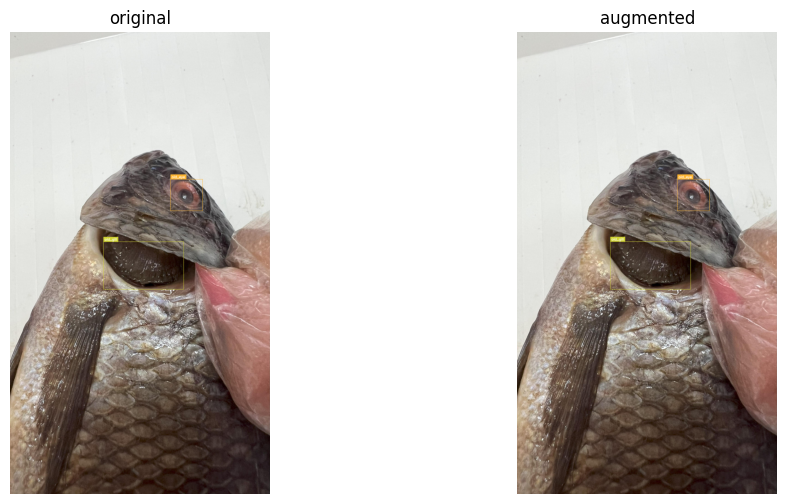

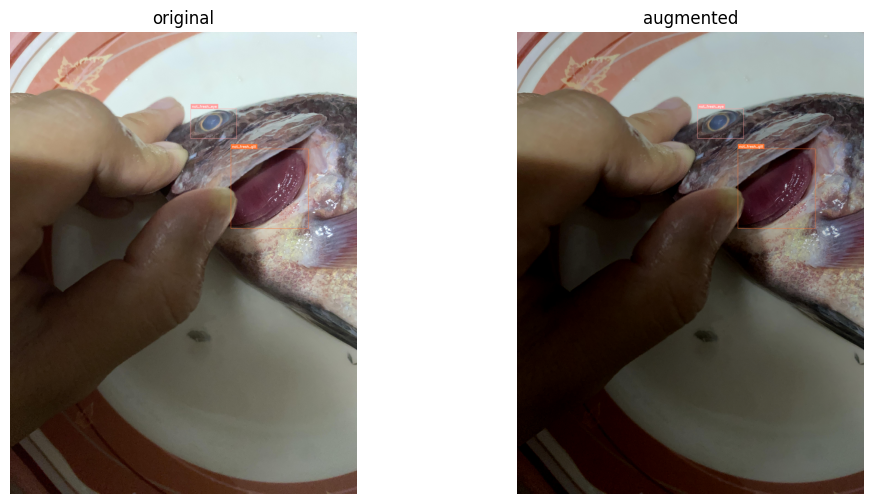

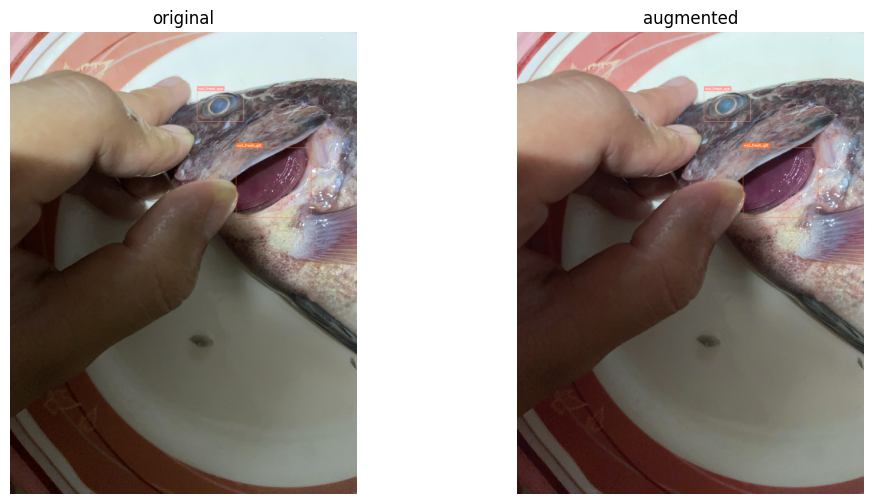

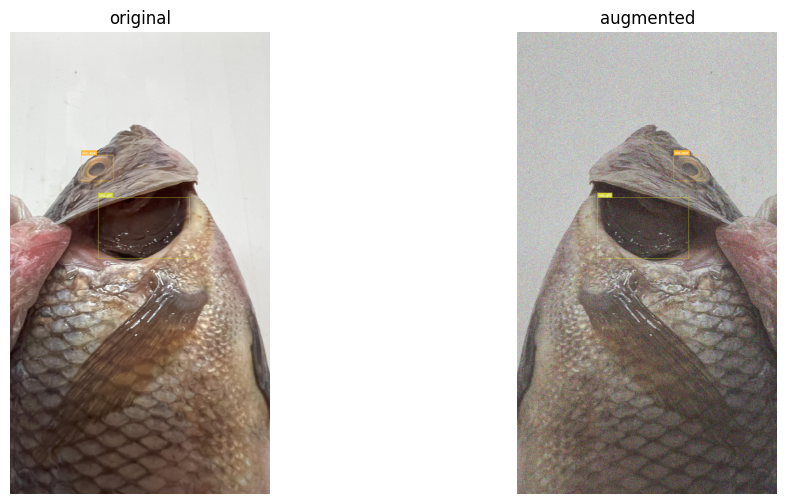

In [ ]:
# @title Visualize some augmented images

IMAGE_COUNT = 20

for i in range(IMAGE_COUNT):
    _, image, annotations = ds_train[i]

    # Apply augmentations
    output = train_augmentation_and_transform(
        image=image,
        bboxes=annotations.xyxy,
        category=annotations.class_id
    )

    augmented_image = output["image"]
    augmented_annotations = replace(
        annotations,
        xyxy=np.array(output["bboxes"]),
        class_id=np.array(output["category"])
    )

    # Prepare original vs augmented visualization
    annotated_images = [
        annotate(image, annotations, ds_train.classes),
        annotate(augmented_image, augmented_annotations, ds_train.classes)
    ]

    # Plot side by side
    sv.plot_images_grid(
        images=annotated_images,
        grid_size=(1, 2),   # 1 row, 2 columns
        titles=['original', 'augmented'],
        size=(12, 6)        # adjust display size
    )

In [ ]:
# @title Preparing images and annotations to be the same format the processor expects
class PyTorchDetectionDataset(Dataset):
    def __init__(self, dataset: sv.DetectionDataset, processor, transform: A.Compose = None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    @staticmethod
    def annotations_as_coco(image_id, categories, boxes):
        annotations = []
        for category, bbox in zip(categories, boxes):
            x1, y1, x2, y2 = bbox
            formatted_annotation = {
                "image_id": image_id,
                "category_id": category,
                "bbox": [x1, y1, x2 - x1, y2 - y1],
                "iscrowd": 0,
                "area": (x2 - x1) * (y2 - y1),
            }
            annotations.append(formatted_annotation)

        return {
            "image_id": image_id,
            "annotations": annotations,
        }

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        _, image, annotations = self.dataset[idx]

        # Convert image to RGB numpy array
        image = image[:, :, ::-1]
        boxes = annotations.xyxy
        categories = annotations.class_id

        if self.transform:
            transformed = self.transform(
                image=image,
                bboxes=boxes,
                category=categories
            )
            image = transformed["image"]
            boxes = transformed["bboxes"]
            categories = transformed["category"]


        formatted_annotations = self.annotations_as_coco(
            image_id=idx, categories=categories, boxes=boxes)
        result = self.processor(
            images=image, annotations=formatted_annotations, return_tensors="pt")


        result = {k: v[0] for k, v in result.items()}

        return result

In [ ]:
# @title Setting up images by train, eval, and test sets
pytorch_dataset_train = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)
pytorch_dataset_eval = PyTorchDetectionDataset(
    ds_val, processor, transform=valid_transform)
pytorch_dataset_test = PyTorchDetectionDataset(
    ds_test, processor, transform=valid_transform)

pytorch_dataset_train[0]
pytorch_dataset_test[0]
pytorch_dataset_eval[0]

In [ ]:
# @title Collator function
def collate_fn(batch):
    data = {}
    data["pixel_values"] = torch.stack([x["pixel_values"] for x in batch])
    data["labels"] = [x["labels"] for x in batch]
    return data

## Preparing function to compute mAP

In [ ]:
id2label = {id: label for id, label in enumerate(ds_train.classes)}
label2id = {label: id for id, label in enumerate(ds_train.classes)}


@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor


class MAPEvaluator:

    def __init__(self, image_processor, threshold=0.00, id2label=None):
        self.image_processor = image_processor
        self.threshold = threshold
        self.id2label = id2label

    def collect_image_sizes(self, targets):
        """Collect image sizes across the dataset as list of tensors with shape [batch_size, 2]."""
        image_sizes = []
        for batch in targets:
            batch_image_sizes = torch.tensor(np.array([x["size"] for x in batch]))
            image_sizes.append(batch_image_sizes)
        return image_sizes

    def collect_targets(self, targets, image_sizes):
        post_processed_targets = []
        for target_batch, image_size_batch in zip(targets, image_sizes):
            for target, image_size in zip(target_batch, image_size_batch):
                height, width = image_size.tolist()
                boxes = target["boxes"]
                boxes = sv.xcycwh_to_xyxy(boxes)
                boxes = boxes * np.array([width, height, width, height])
                boxes = torch.tensor(boxes)
                labels = torch.tensor(target["class_labels"])
                post_processed_targets.append({"boxes": boxes, "labels": labels})
        return post_processed_targets

    def collect_predictions(self, predictions, image_sizes):
        post_processed_predictions = []
        for batch, target_sizes in zip(predictions, image_sizes):
            batch_logits, batch_boxes = batch[1], batch[2]
            output = ModelOutput(logits=torch.tensor(batch_logits), pred_boxes=torch.tensor(batch_boxes))
            post_processed_output = self.image_processor.post_process_object_detection(
                output, threshold=self.threshold, target_sizes=target_sizes
            )
            post_processed_predictions.extend(post_processed_output)
        return post_processed_predictions

    @torch.no_grad()
    def __call__(self, evaluation_results):

        predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

        image_sizes = self.collect_image_sizes(targets)
        post_processed_targets = self.collect_targets(targets, image_sizes)
        post_processed_predictions = self.collect_predictions(predictions, image_sizes)

        evaluator = MeanAveragePrecision(box_format="xyxy", class_metrics=True)
        evaluator.warn_on_many_detections = False
        evaluator.update(post_processed_predictions, post_processed_targets)

        metrics = evaluator.compute()

        classes = metrics.pop("classes")
        map_per_class = metrics.pop("map_per_class")
        mar_100_per_class = metrics.pop("mar_100_per_class")
        for class_id, class_map, class_mar in zip(classes, map_per_class, mar_100_per_class):
            class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
            metrics[f"map_{class_name}"] = class_map
            metrics[f"mar_100_{class_name}"] = class_mar

        metrics = {k: round(v.item(), 4) for k, v in metrics.items()}

        return metrics

eval_compute_metrics_fn = MAPEvaluator(image_processor=processor, threshold=0.01, id2label=id2label)

## Training the model


In [ ]:
# @title Loading the model
model = AutoModelForObjectDetection.from_pretrained(
    CHECKPOINT,
    id2label=id2label,
    label2id=label2id,
    anchor_image_size=None,
    ignore_mismatched_sizes=True,
)

Some weights of RTDetrV2ForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_v2_r50vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([6]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([6, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([6]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([6, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([6]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([6, 256]) in the model instantiated
- model.decod

In [ ]:
# @title Defining Hyperparameters
training_args = TrainingArguments(
    output_dir=f"{dataset.name.replace(' ', '-')}-rtdetrv2-baseline",

    # Training duration - reduced to prevent overfitting on small dataset
    num_train_epochs=50,  # Increased from 40 for better convergence with cosine scheduler

    # Learning rate schedule
    learning_rate=5e-5,   # Reduced from 1e-4 for more stable training on small dataset
    warmup_steps=200,     # Reduced from 300 (warmup ~10% of total steps)
    lr_scheduler_type="cosine",

    # Batch configuration for T4 GPU (16GB VRAM)
    per_device_train_batch_size=4,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=4,  # Effective batch size = 16

    # Optimizer settings
    optim="adamw_torch",
    weight_decay=5e-4,    # Increased from 1e-4 for better regularization

    # Evaluation and checkpointing
    eval_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=5,   # Reduced from 10 to save disk space
    load_best_model_at_end=True,
    metric_for_best_model="eval_map",
    greater_is_better=True,

    # Logging
    logging_strategy="steps",
    logging_steps=25,     # Log every ~100 images (25 steps * 4 batch size)

    # Data loading optimization for T4 + High RAM
    dataloader_num_workers=4,  # Reduced from 8 (T4 has fewer CPU cores than L4)
    dataloader_pin_memory=True,
    dataloader_persistent_workers=True,
    dataloader_prefetch_factor=2,  # Added: prefetch 2 batches per worker

    # Memory and stability
    max_grad_norm=1.0,
    remove_unused_columns=False,
    eval_do_concat_batches=False,

    # Mixed precision for T4
    fp16=True,
    fp16_full_eval=True,  # Added: use fp16 during evaluation too

    # Reproducibility
    seed=42,
    data_seed=42,  # Added: ensures data shuffling is reproducible

    # Monitoring
    report_to="tensorboard",

    # Additional settings
    ignore_data_skip=True,
    prediction_loss_only=False,
    group_by_length=False,
)

In [ ]:
# @title Passing Training Arguments to the trainer and calling the Train Function
from transformers import EarlyStoppingCallback
from transformers.trainer_callback import TrainerCallback
import torch

# Custom callback to monitor training
class MetricsCallback(TrainerCallback):
    def on_evaluate(self, args, state, control, model=None, logs=None, **kwargs):
        if logs:
            print(f"Epoch {state.epoch}: mAP = {logs.get('eval_map', 0):.4f}")

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=pytorch_dataset_train,
    eval_dataset=pytorch_dataset_eval,
    #tokenizer=processor,
    data_collator=collate_fn,
    compute_metrics=eval_compute_metrics_fn,
    callbacks=[
        EarlyStoppingCallback(early_stopping_patience=5, early_stopping_threshold=0.001),  # More patience
        MetricsCallback(),
    ],
)

# Train with resume capability
trainer.train()

Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Fresh Eye,Mar 100 Fresh Eye,Map Fresh Gill,Mar 100 Fresh Gill,Map Not Fresh Eye,Mar 100 Not Fresh Eye,Map Not Fresh Gill,Mar 100 Not Fresh Gill,Map Old Eye,Mar 100 Old Eye,Map Old Gill,Mar 100 Old Gill
1,9.150100,8.985228,0.545300,0.796100,0.623500,-1.000000,0.466600,0.524200,0.743000,0.761900,0.763100,-1.000000,0.711600,0.801000,0.814300,0.875000,0.507900,0.778200,0.365100,0.679500,0.476300,0.851300,0.578900,0.691300,0.529300,0.703500
2,9.094500,9.068751,0.616300,0.894800,0.715900,-1.000000,0.613600,0.615700,0.744300,0.761500,0.762400,-1.000000,0.702800,0.799600,0.781200,0.846800,0.456300,0.784000,0.539400,0.742300,0.807500,0.859000,0.561900,0.667300,0.551700,0.675000
3,9.231600,8.719641,0.604100,0.896900,0.678800,-1.000000,0.601600,0.592500,0.737100,0.753000,0.753300,-1.000000,0.686000,0.784200,0.803100,0.870500,0.465200,0.762800,0.492700,0.691000,0.731300,0.837200,0.591300,0.679200,0.540700,0.678800
4,9.114500,8.334812,0.616000,0.894900,0.708400,-1.000000,0.617400,0.595700,0.744400,0.756600,0.756600,-1.000000,0.692900,0.796200,0.831100,0.871200,0.510600,0.766700,0.552100,0.705100,0.680800,0.852600,0.579200,0.663100,0.542300,0.680800
5,9.064100,8.423880,0.588300,0.861500,0.683300,-1.000000,0.611500,0.563100,0.743900,0.755500,0.755500,-1.000000,0.689900,0.796700,0.794600,0.865400,0.504800,0.772400,0.561600,0.716700,0.585100,0.850000,0.546000,0.652900,0.537600,0.675600
6,8.779500,7.704645,0.634800,0.922800,0.736200,-1.000000,0.638300,0.633800,0.743100,0.756300,0.756300,-1.000000,0.695900,0.792300,0.828700,0.864100,0.581500,0.760900,0.576500,0.716700,0.741800,0.846200,0.540700,0.665400,0.539300,0.684600
7,8.991100,6.684282,0.644100,0.942100,0.754400,-1.000000,0.644000,0.643400,0.736100,0.746300,0.746300,-1.000000,0.693600,0.773600,0.815300,0.848700,0.640300,0.725600,0.574300,0.726900,0.699800,0.837200,0.592400,0.656700,0.542600,0.682400
8,9.113100,10.534852,0.538900,0.791800,0.616700,-1.000000,0.589400,0.525800,0.739700,0.741300,0.741300,-1.000000,0.674400,0.783600,0.782000,0.867900,0.406600,0.730800,0.393900,0.678200,0.588600,0.860300,0.542500,0.643300,0.519800,0.667600
9,8.991200,9.690109,0.576200,0.843400,0.672400,-1.000000,0.590100,0.582900,0.739300,0.743300,0.743300,-1.000000,0.678800,0.787700,0.781100,0.855800,0.426200,0.742900,0.457800,0.669200,0.668800,0.855100,0.579600,0.660900,0.543800,0.676000
10,8.880100,10.516666,0.464000,0.686900,0.535000,-1.000000,0.562400,0.483100,0.726600,0.750600,0.750600,-1.000000,0.693400,0.791000,0.774900,0.859000,0.424700,0.758300,0.228800,0.697400,0.223100,0.853800,0.573700,0.652600,0.558900,0.682400


There were missing keys in the checkpoint model loaded: ['class_embed.0.weight', 'class_embed.0.bias', 'class_embed.1.weight', 'class_embed.1.bias', 'class_embed.2.weight', 'class_embed.2.bias', 'class_embed.3.weight', 'class_embed.3.bias', 'class_embed.4.weight', 'class_embed.4.bias', 'class_embed.5.weight', 'class_embed.5.bias', 'bbox_embed.0.layers.0.weight', 'bbox_embed.0.layers.0.bias', 'bbox_embed.0.layers.1.weight', 'bbox_embed.0.layers.1.bias', 'bbox_embed.0.layers.2.weight', 'bbox_embed.0.layers.2.bias', 'bbox_embed.1.layers.0.weight', 'bbox_embed.1.layers.0.bias', 'bbox_embed.1.layers.1.weight', 'bbox_embed.1.layers.1.bias', 'bbox_embed.1.layers.2.weight', 'bbox_embed.1.layers.2.bias', 'bbox_embed.2.layers.0.weight', 'bbox_embed.2.layers.0.bias', 'bbox_embed.2.layers.1.weight', 'bbox_embed.2.layers.1.bias', 'bbox_embed.2.layers.2.weight', 'bbox_embed.2.layers.2.bias', 'bbox_embed.3.layers.0.weight', 'bbox_embed.3.layers.0.bias', 'bbox_embed.3.layers.1.weight', 'bbox_embed.3.l

TrainOutput(global_step=1092, training_loss=8.980840145013271, metrics={'train_runtime': 2451.4548, 'train_samples_per_second': 29.676, 'train_steps_per_second': 1.856, 'total_flos': 5.50156068569088e+18, 'train_loss': 8.980840145013271, 'epoch': 12.0})

In [ ]:
# @title Empty cache to free up Ram / VRAM
import torch
torch.cuda.empty_cache()

## Evaluate

In [ ]:
# @title Save the model on google drive
model.save_pretrained("/content/rt-detr/")
processor.save_pretrained("/content/rt-detr/")

# Create a directory in gdrive for saving the model
save_path = "/content/drive/MyDrive/rt-detr-checkpoint"
os.makedirs(save_path, exist_ok=True)

# Save model and processor
model.save_pretrained(save_path)
processor.save_pretrained(save_path)

['/content/drive/MyDrive/rt-detr-checkpoint/preprocessor_config.json']

In [ ]:
# @title Collecting Predictions and Results using the Test Images
targets = []
predictions = []
model.eval()

for i in range(len(ds_test)):
    path, source_image, annotations = ds_test[i]

    image = Image.open(path).convert('RGB')
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.5
    )

    detections = sv.Detections.from_transformers(results[0])


    if len(annotations) > 0:
        gt_xyxy = annotations.xyxy
        # if normalized: gt_xyxy = annotations.xyxy * [w, h, w, h]

        target_detections = sv.Detections(
            xyxy=gt_xyxy,
            class_id=np.array(annotations.class_id),
            confidence=np.ones(len(annotations))
        )
    else:
        target_detections = sv.Detections.empty()


    if len(detections) > 0:
        fixed_detections = sv.Detections(
            xyxy=detections.xyxy,
            class_id=np.array(detections.class_id),
            confidence=detections.confidence
        )
    else:
        fixed_detections = sv.Detections.empty()

    targets.append(target_detections)
    predictions.append(fixed_detections)


mean_average_precision = sv.MeanAveragePrecision.from_detections(
    predictions=predictions,
    targets=targets,
)

print(f"map50_95: {mean_average_precision.map50_95:.3f}")
print(f"map50: {mean_average_precision.map50:.3f}")
print(f"map75: {mean_average_precision.map75:.3f}")


map50_95: 0.582
map50: 0.728
map75: 0.702


MeanAveragePrecision is deprecated: `MeanAveragePrecision` is deprecated and will be removed in `supervision-0.31.0`. Use `supervision.metrics.mean_average_precision.MeanAveragePrecision` instead. The deprecated implementation provides results that are inconsistent with pycocotools.



Confusion Matrix Info:
Matrix shape: (7, 7)
Matrix sum: 1137.0


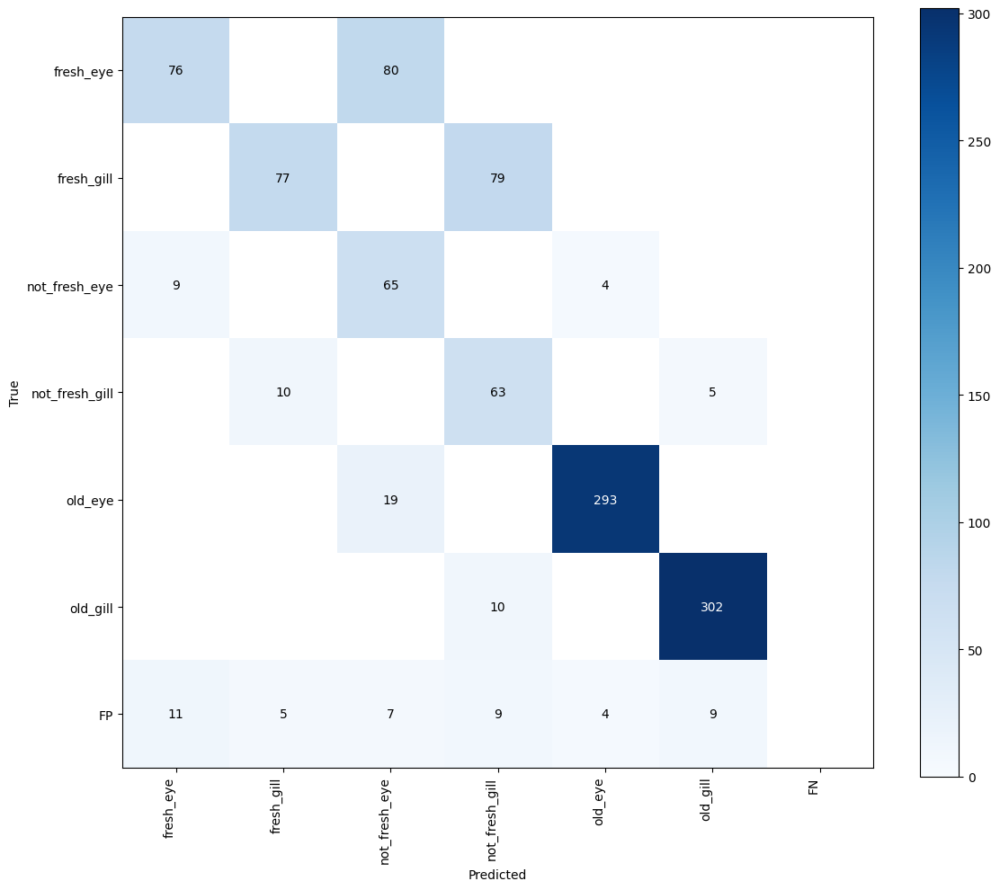

In [ ]:
# @title Calculate Confusion Matrix
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=label2id,
    conf_threshold=0.5,
    iou_threshold=0.5
)

print(f"\nConfusion Matrix Info:")
print(f"Matrix shape: {confusion_matrix.matrix.shape}")
print(f"Matrix sum: {confusion_matrix.matrix.sum()}")

_ = confusion_matrix.plot()

## Inference with fine-tuned RT-DETR model

Image 0: Found 2 detections


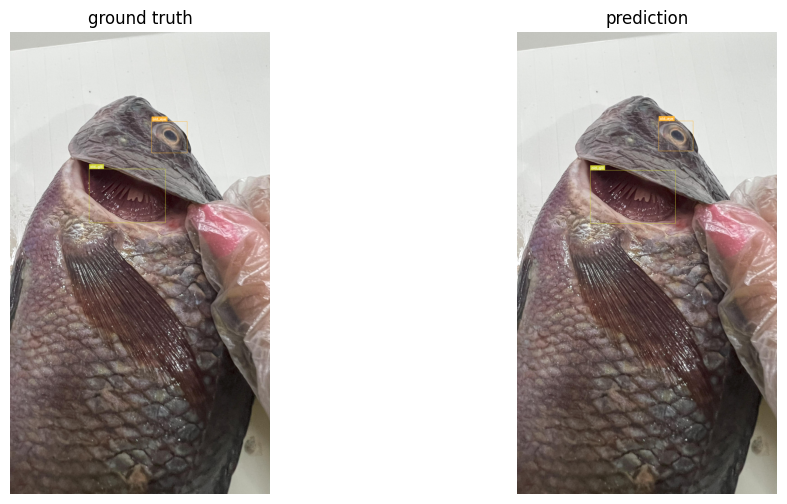

Image 1: Found 2 detections


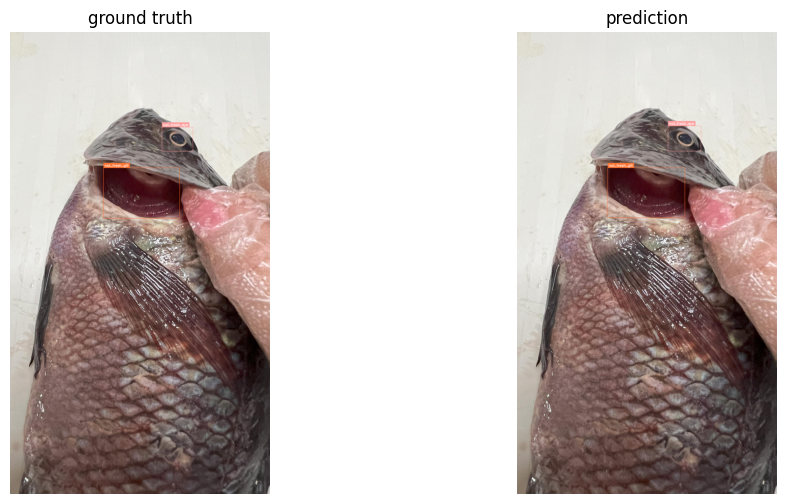

Image 2: Found 2 detections


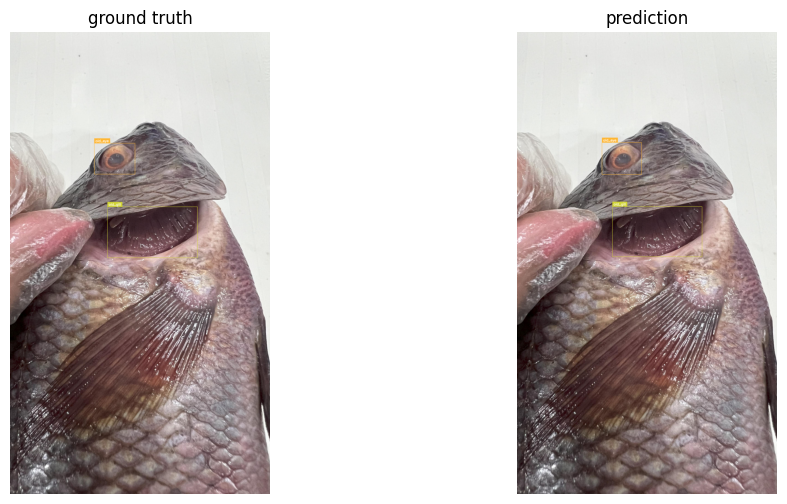

Image 3: Found 2 detections


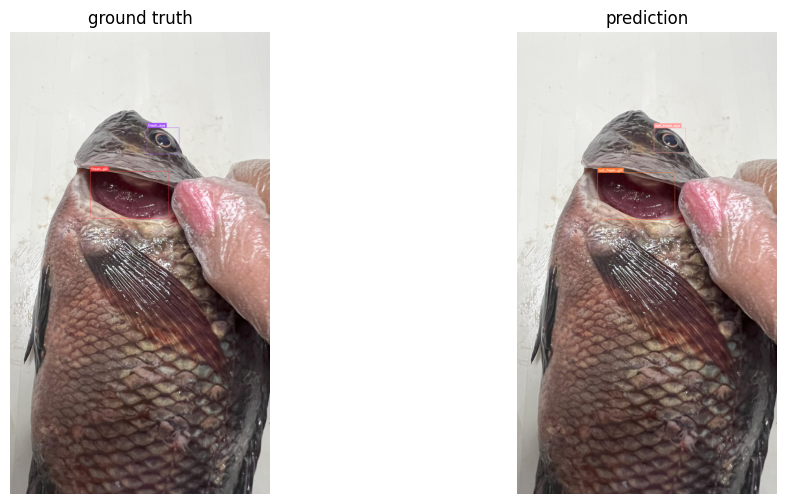

Image 4: Found 2 detections


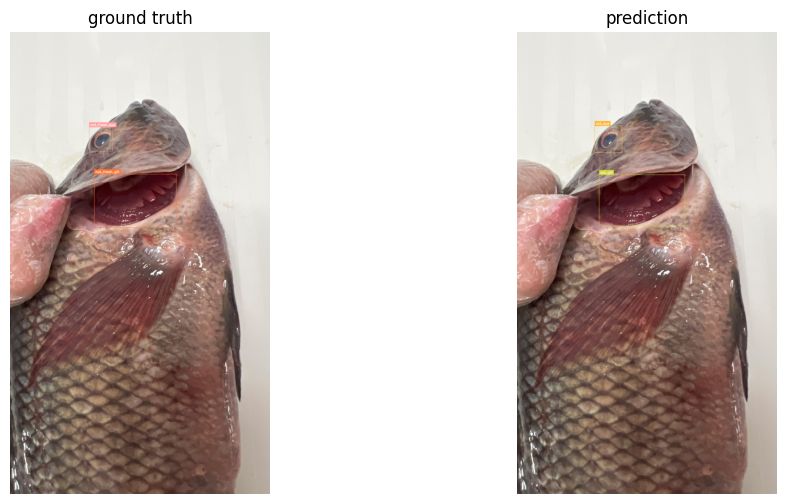

Image 5: Found 2 detections


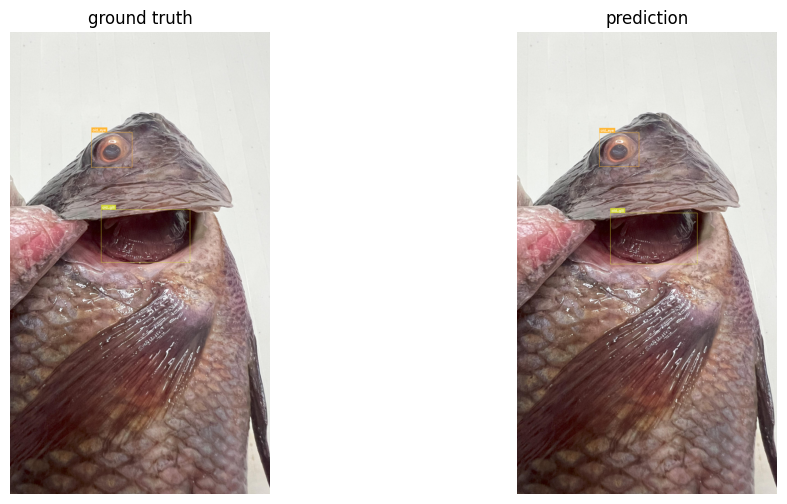

Image 6: Found 2 detections


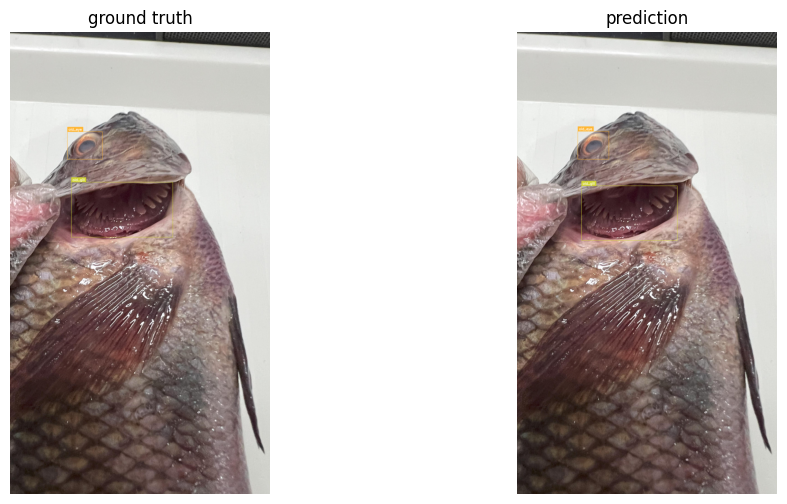

Image 7: Found 2 detections


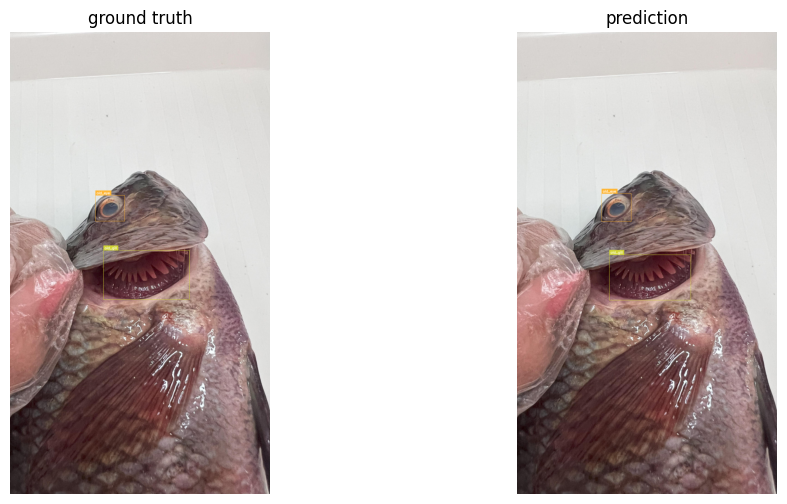

Image 8: Found 2 detections


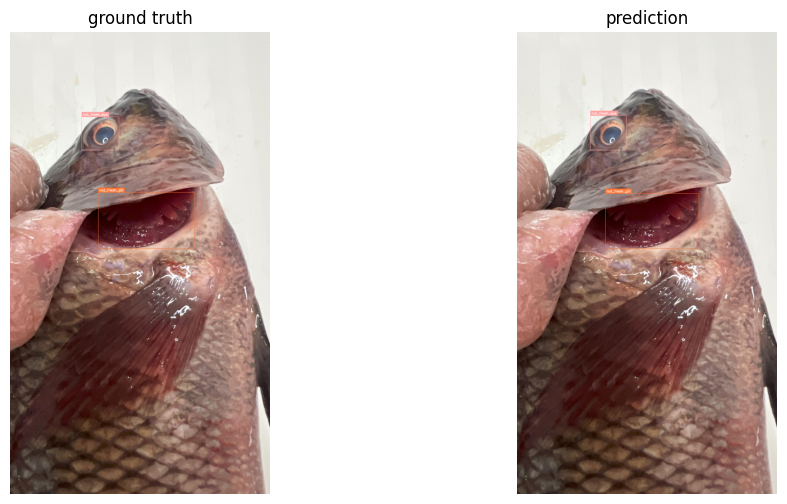

Image 9: Found 2 detections


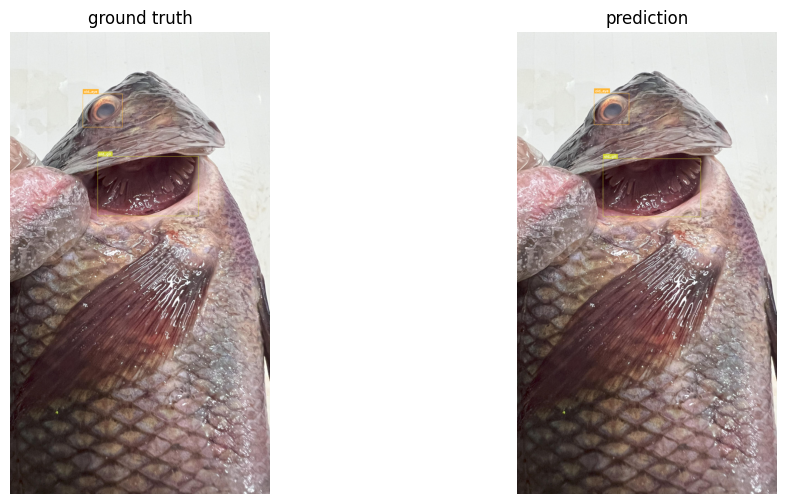

Image 10: Found 2 detections


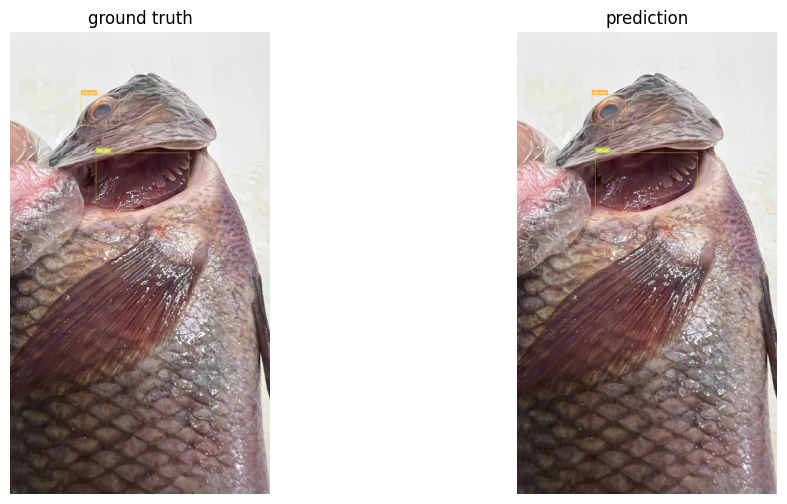

Image 11: Found 2 detections


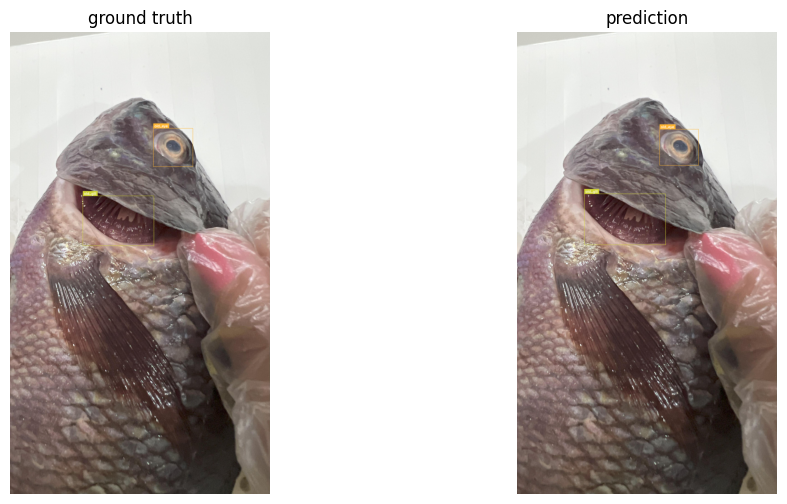

Image 12: Found 2 detections


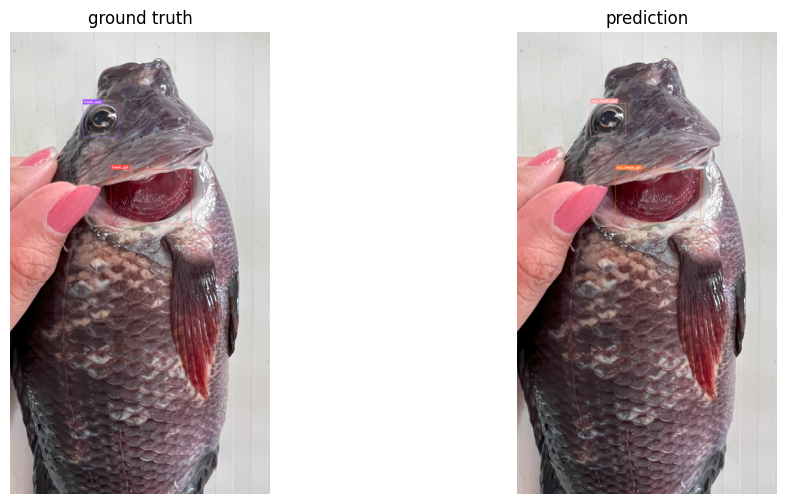

Image 13: Found 2 detections


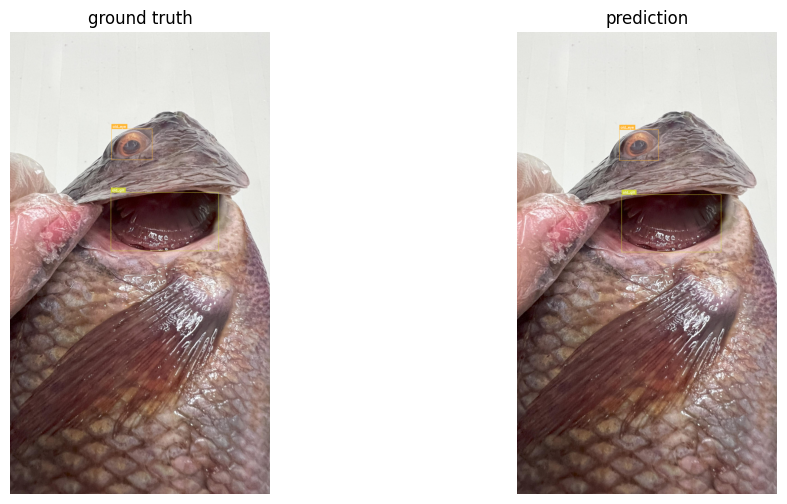

Image 14: Found 2 detections


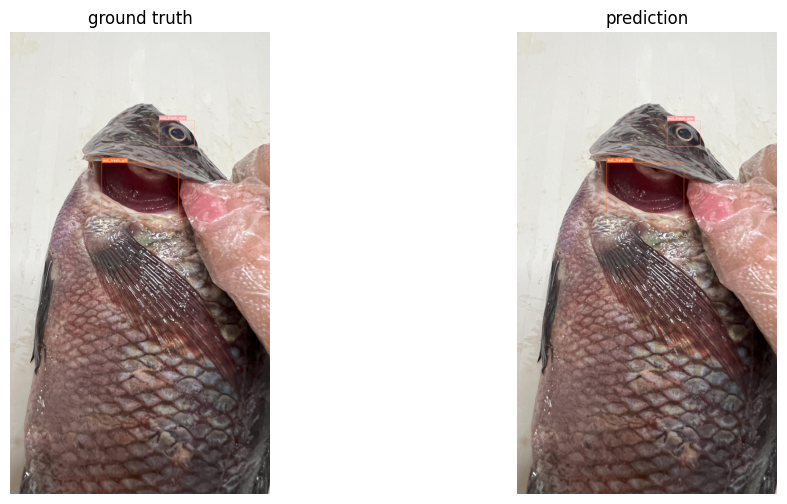

In [ ]:
IMAGE_COUNT = 15

# Set model to evaluation mode
model.eval()

for i in range(IMAGE_COUNT):
    path, source_image, annotations = ds_test[i]

    # Load test image and ensure RGB format
    image = Image.open(path).convert('RGB')
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    # Inference
    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size

    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.5
    )

    detections = sv.Detections.from_transformers(results[0]).with_nms(threshold=0.1)

    #Print detection count
    print(f"Image {i}: Found {len(detections)} detections")

    # Ground truth vs prediction
    annotated_images = [
        annotate(source_image, annotations, ds_test.classes),  # Fixed: use ds_test
        annotate(source_image, detections, ds_test.classes)    # Fixed: use ds_test
    ]

    sv.plot_images_grid(
        annotated_images,
        titles=['ground truth', 'prediction'],
        grid_size=(1, 2),   # 1 row, 2 columns
        size=(12, 6)        # Figure size
    )

# Inference to Run a single image

In [ ]:
from PIL import Image
import torch
import supervision as sv

# Img should be available on gdrive
image_path = "/content/drive/MyDrive/IMG_0317.JPG"

# Set model to evaluation mode
model.eval()

# Load image
image = Image.open(image_path).convert("RGB")
w, h = image.size

# Preprocess image
inputs = processor(image, return_tensors="pt").to(DEVICE)

# Inference
with torch.no_grad():
    outputs = model(**inputs)


results = processor.post_process_object_detection(
    outputs, target_sizes=[(h, w)], threshold=0.5)

detections = sv.Detections.from_transformers(results[0]).with_nms(threshold=0.1)

#Print detection info
print(f"Found {len(detections)} detections")
if len(detections) > 0:
    print(f"Classes detected: {detections.class_id}")
    print(f"Confidences: {detections.confidence}")
    print(f"Class names: {[ds_test.classes[cid] for cid in detections.class_id]}")

# Annotate the image
annotated = annotate(image, detections, ds_test.classes)

# Show result
sv.plot_image(annotated, size=(8, 8))

# Calculate Metrics


In [ ]:
import numpy as np

#get confusion‐matrix
cm = confusion_matrix.matrix

#overall accuracy = sum of diagonal / total
accuracy = np.trace(cm) / cm.sum()

#    per‐class precision & recall
#    precision_i = cm[i,i] / sum_j cm[j,i]
#    recall_i    = cm[i,i] / sum_j cm[i,j]
with np.errstate(divide='ignore', invalid='ignore'):
    precision_per_class = np.diag(cm) / cm.sum(axis=0)
    recall_per_class    = np.diag(cm) / cm.sum(axis=1)
    f1_per_class        = 2 * (precision_per_class * recall_per_class) \
                          / (precision_per_class + recall_per_class)


precision_macro = np.nanmean(precision_per_class)
recall_macro    = np.nanmean(recall_per_class)
f1_macro        = np.nanmean(f1_per_class)


print(f"Accuracy:           {accuracy:.4f}")
print(f"Precision:    {precision_macro:.4f}")
print(f"Recall:       {recall_macro:.4f}")
print(f"F1:           {f1_macro:.4f}\n")

print("Per‐class metrics:")
for cls, p, r, f1 in zip(ds_test.classes,
                         precision_per_class,
                         recall_per_class,
                         f1_per_class):
    print(f"  {cls:15s} P={p:.3f}  R={r:.3f}  F1={f1:.3f}")

Accuracy:           0.7704
Macro Precision:    0.7215
Macro Recall:       0.6470
Macro F1:           0.6985

Per‐class metrics:
  fresh_eye       P=0.792  R=0.487  F1=0.603
  fresh_gill      P=0.837  R=0.494  F1=0.621
  not_fresh_eye   P=0.380  R=0.833  F1=0.522
  not_fresh_gill  P=0.391  R=0.808  F1=0.527
  old_eye         P=0.973  R=0.939  F1=0.956
  old_gill        P=0.956  R=0.968  F1=0.962
